# Scanning The Operating Parameters Redux

First we set up the FPE:

In [ ]:
from tessfpe.dhu.fpe import FPE
from tessfpe.dhu.unit_tests import check_house_keeping_voltages
fpe1 = FPE(1, debug=False, preload=False, FPE_Wrapper_version='6.1.1')
print fpe1.version
if check_house_keeping_voltages(fpe1):
    print "Wrapper load complete. Interface voltages OK."

We now walk through setting each value from its high to its low.

In [ ]:
def set_fpe_defaults(fpe):
    "Set the FPE to the default operating parameters, and outputs a table of the default values"
    defaults = {}
    for k in range(len(fpe.ops.address)):
        if fpe.ops.address[k] is None:
            continue
        fpe.ops.address[k].value = fpe.ops.address[k].default
        defaults[fpe.ops.address[k].name] = fpe.ops.address[k].default
    return defaults

In [ ]:
data = []

steps = 50

for k in range(len(fpe1.ops.address)):
    if fpe1.ops.address[k] is None:
        continue
    for i in range(steps,0,-1):
        set_values = set_fpe_defaults(fpe1)
        low = fpe1.ops.address[k].low
        high = fpe1.ops.address[k].high
        name = fpe1.ops.address[k].name
        set_values[name] = fpe1.ops.address[k].value = low + i / float(steps) * (high - low)
        fpe1.ops.send()
        data.append({"set values": set_values,
                     "measured values": fpe1.house_keeping["analogue"]})

In [ ]:
fpe1.ops.heater_1_current = fpe1.ops.heater_2_current = fpe1.ops.heater_3_current = fpe1.ops.heater_3_current.low
fpe1.ops.send()

In [ ]:
set_min_values = {}
set_max_values = {}
measured_min_values = {}
measured_max_values = {}
for datum in data:
    for k in range(len(fpe1.ops.address)):
        if fpe1.ops.address[k] is None:
            continue
        name = fpe1.ops.address[k].name
        if name not in datum['measured values']:
            continue
        if name not in measured_min_values or \
           measured_min_values[name] > datum["measured values"][name]:
            measured_min_values[name] = datum["measured values"][name]
        if name not in measured_max_values or \
           measured_max_values[name] < datum["measured values"][name]:
            measured_max_values[name] = datum["measured values"][name]
        if name not in set_min_values or \
           set_min_values[name] > datum["set values"][name]:
            set_min_values[name] = datum["set values"][name]
        if name not in set_max_values or \
           set_max_values[name] < datum["set values"][name]:
            set_max_values[name] = datum["set values"][name]

for k in range(len(fpe1.ops.address)):
    if fpe1.ops.address[k] is None:
        continue
    name = fpe1.ops.address[k].name
    if name not in datum['measured values']:
        continue
    unit = fpe1.ops.address[k].unit
    expected_low = fpe1.ops.address[k].low
    actual_minimum = measured_min_values[name]
    expected_high = fpe1.ops.address[k].high
    actual_maximum = measured_max_values[name]
    if expected_low < expected_high:
        actual_low = actual_minimum
        actual_high = actual_maximum
    else:
        actual_high = actual_minimum
        actual_low = actual_maximum
    
    print "{name}:".format(name = name)
    print "\tExpected Low: {expected_low} {unit}".format(expected_low=expected_low,
                                                         unit=unit)
    print "\tActual Low: {actual_low} {unit}".format(actual_low=actual_low,
                                                     unit=unit)
    print "\tExpected High: {expected_high} {unit}".format(expected_high=expected_high,
                                                            unit=unit)
    print "\tActual High: {actual_high} {unit}".format(actual_high=actual_high,
                                                       unit=unit)
    print

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pylab

In [ ]:
from collections import defaultdict

# Collect the set and measured values
X = defaultdict(list)
Y = defaultdict(list)
for datum in data:
    for name in datum['set values']:
        if name not in datum['measured values']:
            continue
        X[name].append(datum['set values'][name])
        Y[name].append(datum['measured values'][name])

In [ ]:
# Plot the set vs. measured values
for nom in X:
    x = X[nom]
    y = Y[nom]
    ran = [min(set_min_values[nom],measured_min_values[nom]),
           max(set_max_values[nom],measured_max_values[nom])]
    pylab.ylim(ran)
    pylab.xlim(ran)
    plt.axes().set_aspect(1)
    plt.title(nom)
    plt.scatter(x,y,color='red')
    plt.show()

In [40]:
from collections import defaultdict
import re

# Collect the set and measured values
X = defaultdict(list)
Y = defaultdict(list)
for datum in data:
    for name in datum['set values']:
        if '_offset' not in name:
            continue
        offset_name = name
        derived_parameter_name = name.replace('_offset', '')
        base_name = None
        if 'low' in derived_parameter_name:
            base_name = derived_parameter_name.replace('low', 'high')            
        if 'high' in derived_parameter_name:
            base_name = derived_parameter_name.replace('high', 'low')
        if 'output_drain' in derived_parameter_name:
            base_name = re.sub(r'output_drain_._offset$', 'reset_drain', offset_name)
        
        assert base_name is not None, "base_name wasn't set!"
        X[derived_parameter_name].append(datum['set values'][base_name] + datum['set values'][offset_name])
        Y[derived_parameter_name].append(datum['measured values'][derived_parameter_name])

In [41]:
def get_range_square(X,Y):
    return [min(X + Y), max(X + Y)]

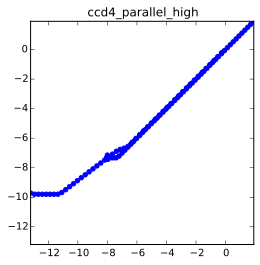

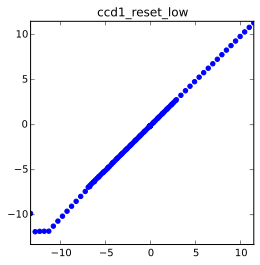

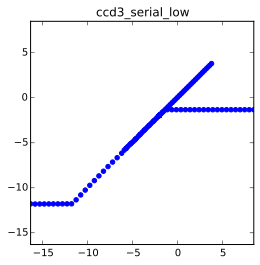

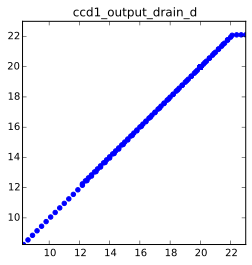

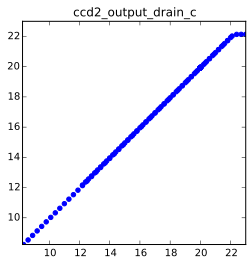

...

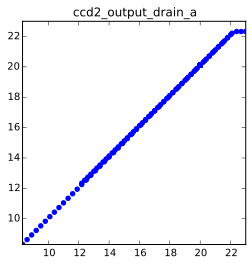

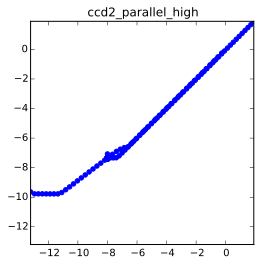

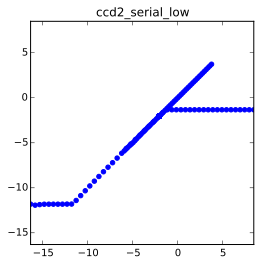

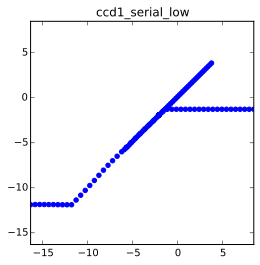

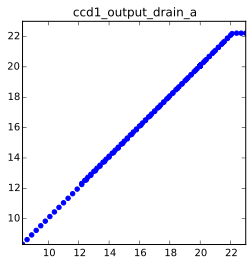

In [43]:
# Plot the set vs. measured values
for nom in X:
    x = X[nom]
    y = Y[nom]
    ran = get_range_square(x,y)
    pylab.ylim(ran)
    pylab.xlim(ran)
    plt.axes().set_aspect(1)
    plt.title(nom)
    plt.scatter(x,y,color='blue')
    plt.show()